<a href="https://colab.research.google.com/github/djbradyAtOpticalSciencesArizona/computationalImaging/blob/master/sampling/toneMapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tone Mapping

## David Brady
## University of Arizona
## Spring 2023

This notebook considers dynamic range and tone mapping of camera image. The basic issue is that a standard exposure is typically digitized with 8 bits, which allows only 255 signal values. Even with these signal values, linear display of the image intensities may not appear natural. Tone mapping implements a nonlinear transformation between scene intensities and display values to 

In [89]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab import files
from google.colab import drive
from skimage import exposure
from skimage.filters import threshold_otsu
from cycler import cycler
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})
plt.rcParams['lines.linewidth'] = 3

In [90]:

!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/hdr/background.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/hdr/foreground.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/hdr/middle.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/hdr/hdrExample.dng'
     

--2023-02-27 02:05:36--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/hdr/background.jpg
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/hdr/background.jpg [following]
--2023-02-27 02:05:36--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/hdr/background.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2107155 (2.0M) [image/jpeg]
Saving to: ‘background.jpg.1’

background.jpg.1    100%[===================>]   2.01M  --.-KB/s    in

In [91]:
!pip install rawpy
import rawpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Bright background behind a shaded foreground

In [92]:
raw = rawpy.imread('hdrExample.dng')
rawImage=raw.raw_image_visible

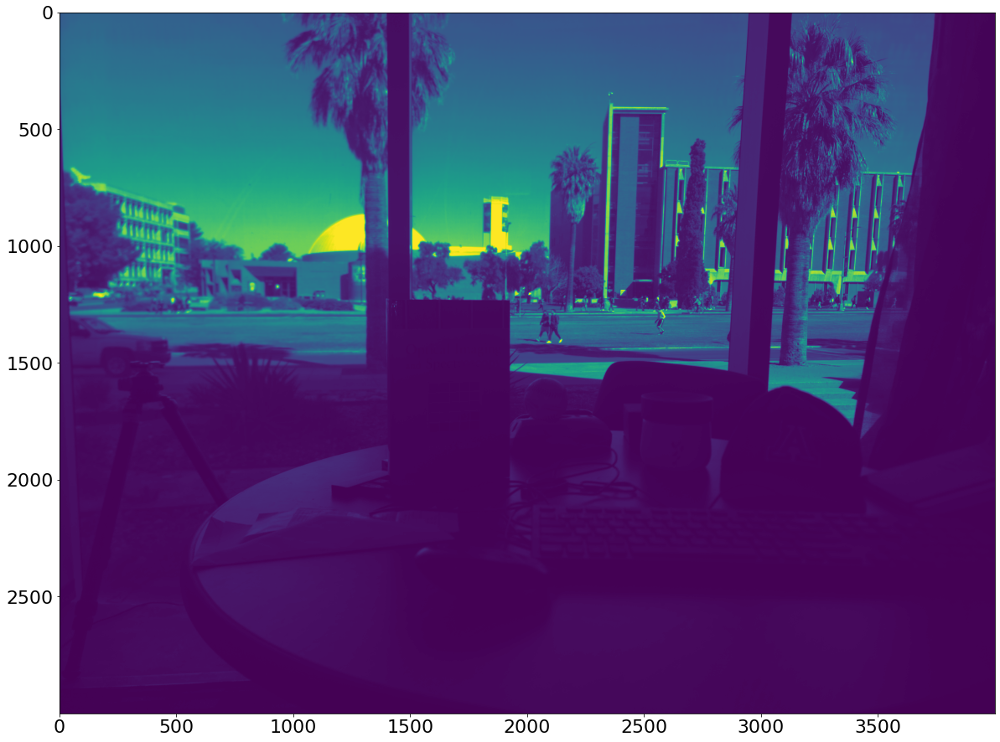

In [10]:
plt.imshow(rawImage)

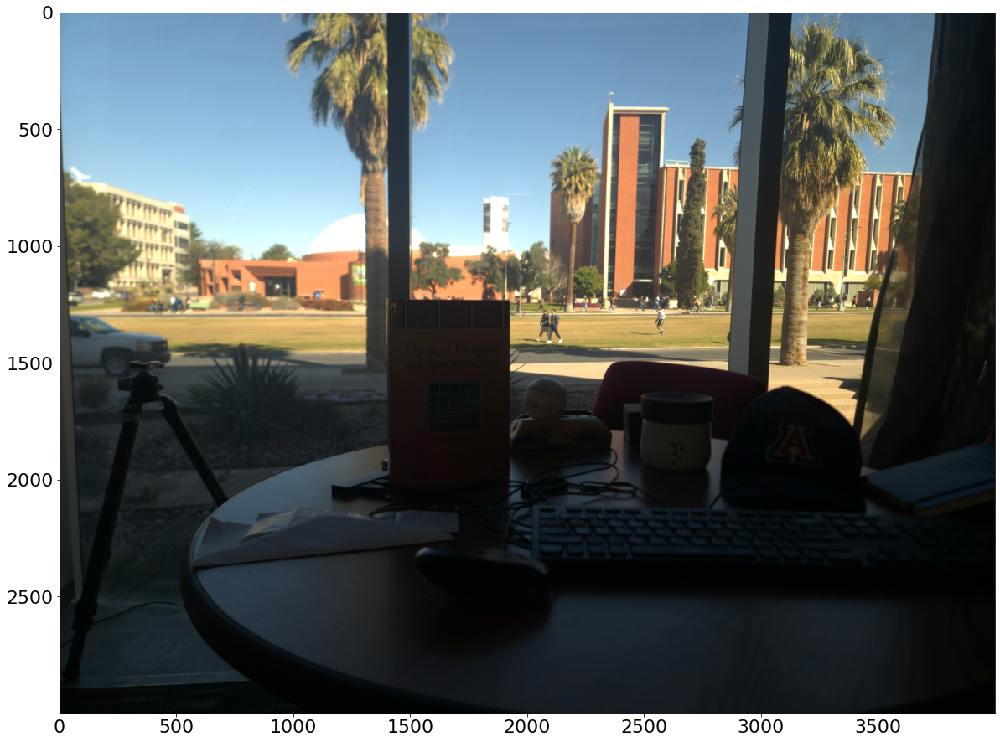

In [93]:
colorImage=raw.postprocess()
plt.imshow(colorImage)

A dark foreground corresponds to a large concentration of image values toward the right of the histogram

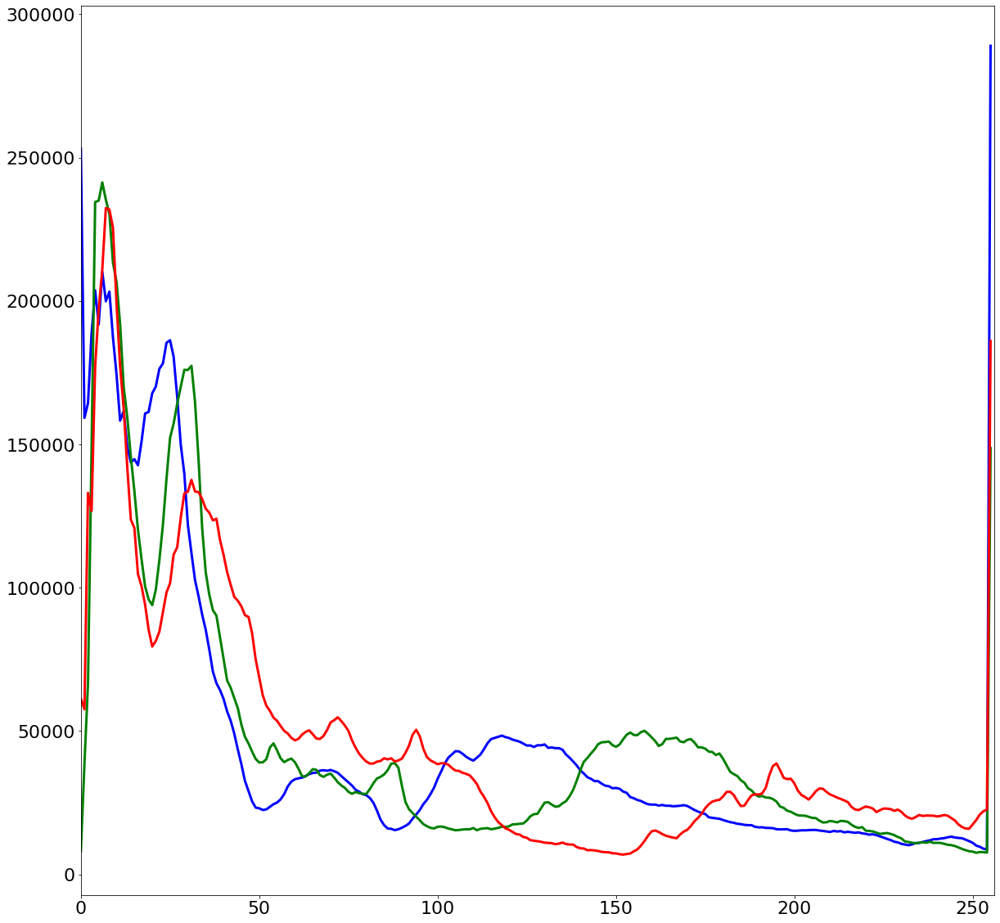

In [ ]:
for i, col in enumerate(['b', 'g', 'r']):
    hist = cv2.calcHist([colorImage], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])

### $\gamma$ correction

A tone map is an association between a stored image value and an output image value. If both the captured image and the display are 8 bit, the signal values are between 0 and 255. With $\gamma$ correction, the relationship between the input and the output is
$O=AI^\gamma$
This relationship is ploted for several values of $\gamma$ below. 

Text(0.5, 0, 'output value relative to max')

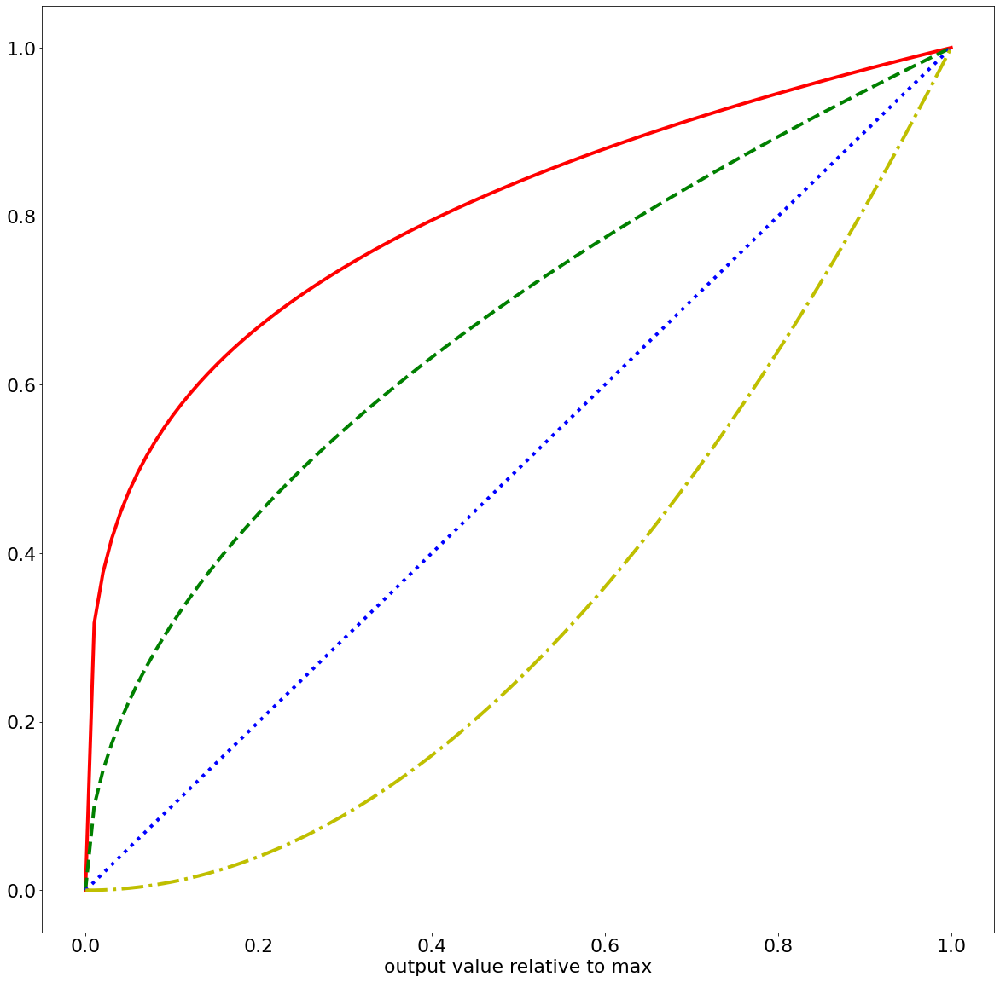

In [70]:
x=np.linspace(0,1,100)
plt.plot(x,x**0.25,x,x**0.5,x,x,x,x**2)
plt.xlabel('input value relative to max')
plt.xlabel('output value relative to max')

OpenCV's gamma adjust function also allows for gain, which is a constant factor shifting the output value relative. Here are plots of our image for the  $\gamma$ values from above.

Text(0.5, 0, 'gamma=2')

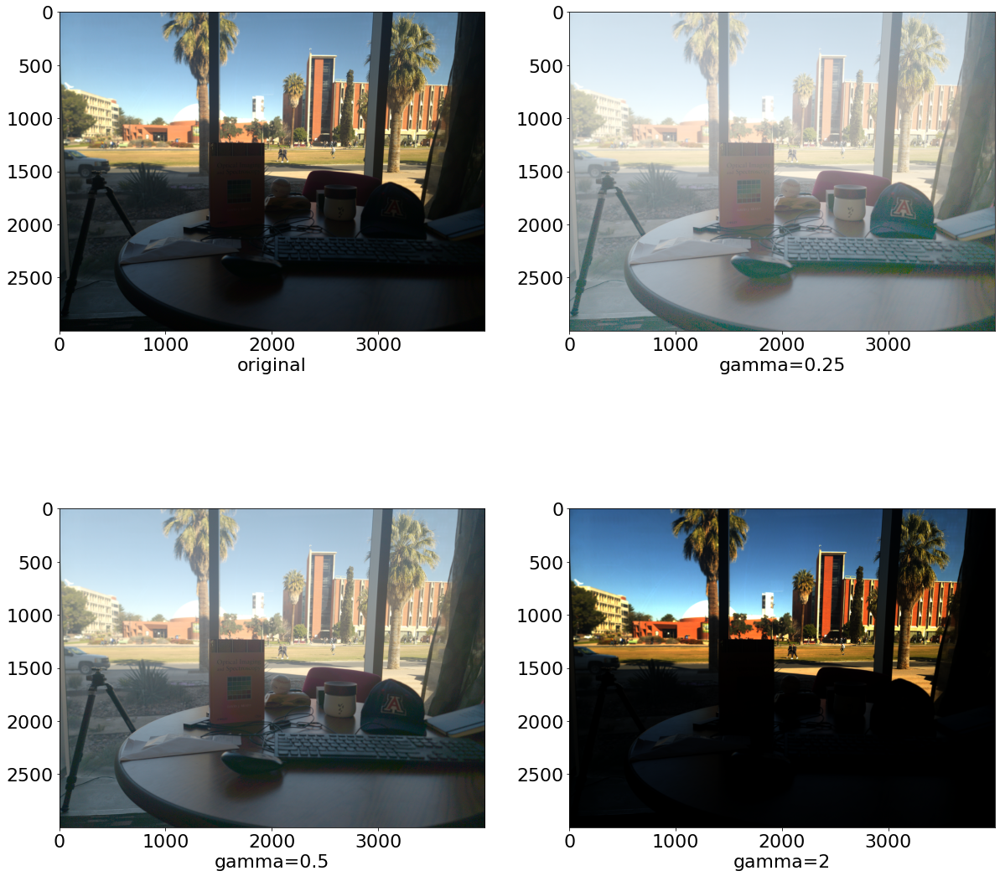

In [71]:
plt.subplot(2,2,1)
plt.imshow(colorImage)
plt.xlabel('original')
plt.subplot(2,2,2)
plt.imshow(exposure.adjust_gamma(colorImage,.25))
plt.xlabel('gamma=0.25')
plt.subplot(2,2,3)
plt.imshow(exposure.adjust_gamma(colorImage,.5))
plt.xlabel('gamma=0.5')
plt.subplot(2,2,4)
plt.imshow(exposure.adjust_gamma(colorImage,2))
plt.xlabel('gamma=2')


### Logarithimic Tone Mapping

Another tone mapping method uses the relationship
$$O=G\log (1+I)$$
Where $G$ is the gain and $I$ is scaled between 0 and 1. If the output signal exceeds 1 for the gain, it may be clipped at the maximum. 

Text(0.5, 0, 'output value relative to max')

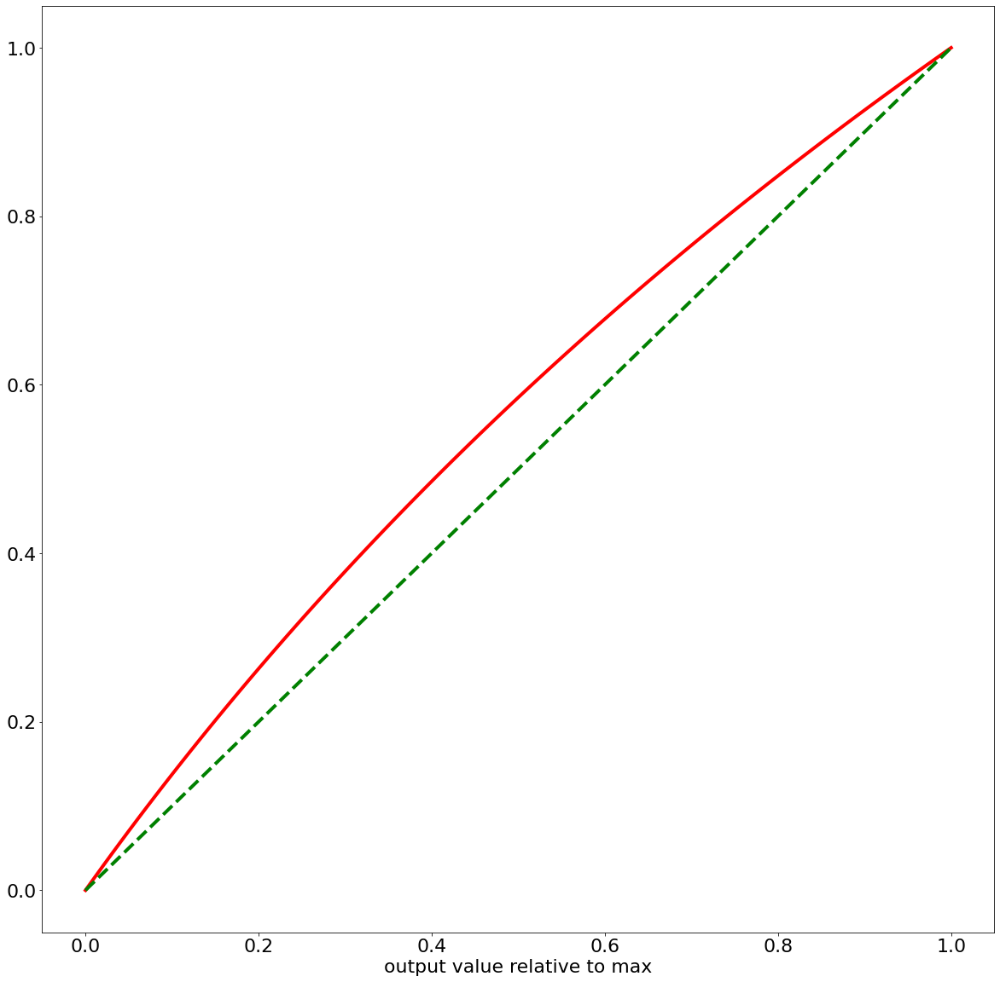

In [76]:
x=np.linspace(0,1,100)
plt.plot(x,np.log(1+x)/np.log(2),x,x)
plt.xlabel('input value relative to max')
plt.xlabel('output value relative to max')

Text(0.5, 0, 'gamma=2')

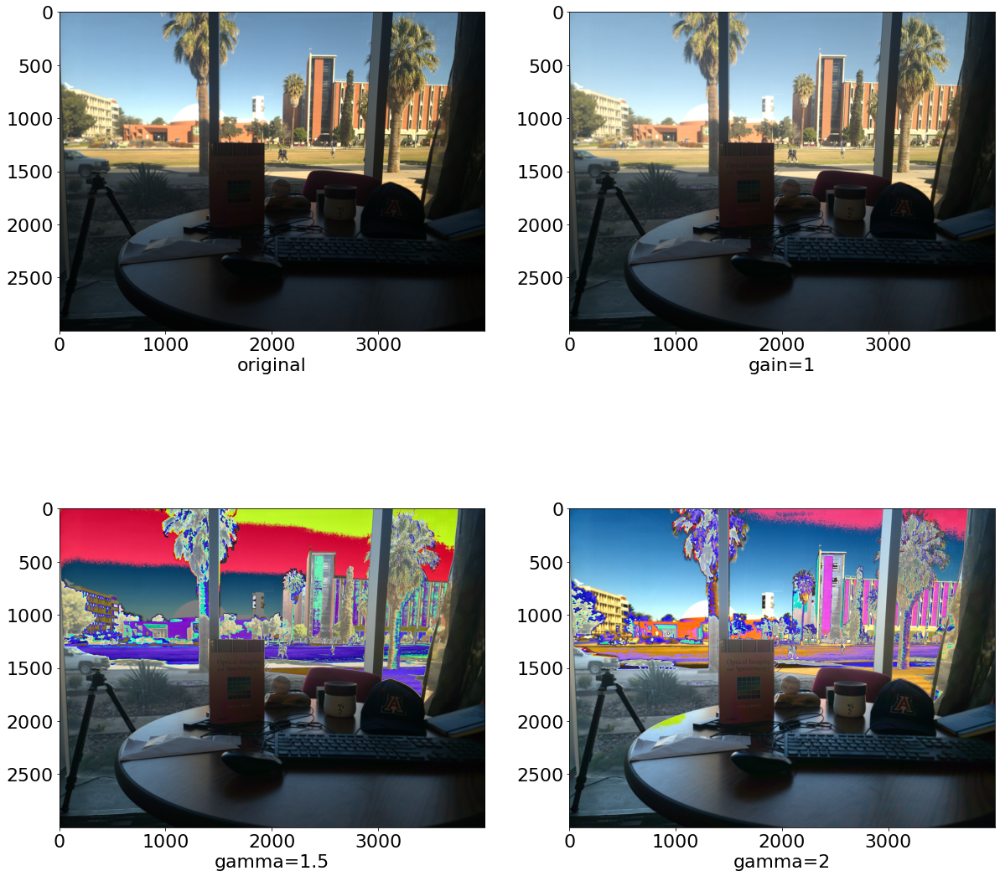

In [78]:
plt.subplot(2,2,1)
plt.imshow(colorImage)
plt.xlabel('original')
plt.subplot(2,2,2)
plt.imshow(exposure.adjust_log(colorImage,1))
plt.xlabel('gain=1')
plt.subplot(2,2,3)
plt.imshow(exposure.adjust_log(colorImage,1.5))
plt.xlabel('gamma=1.5')
plt.subplot(2,2,4)
plt.imshow(exposure.adjust_log(colorImage,2))
plt.xlabel('gamma=2')



Text(0.5, 0, 'Logarithmic tone map')

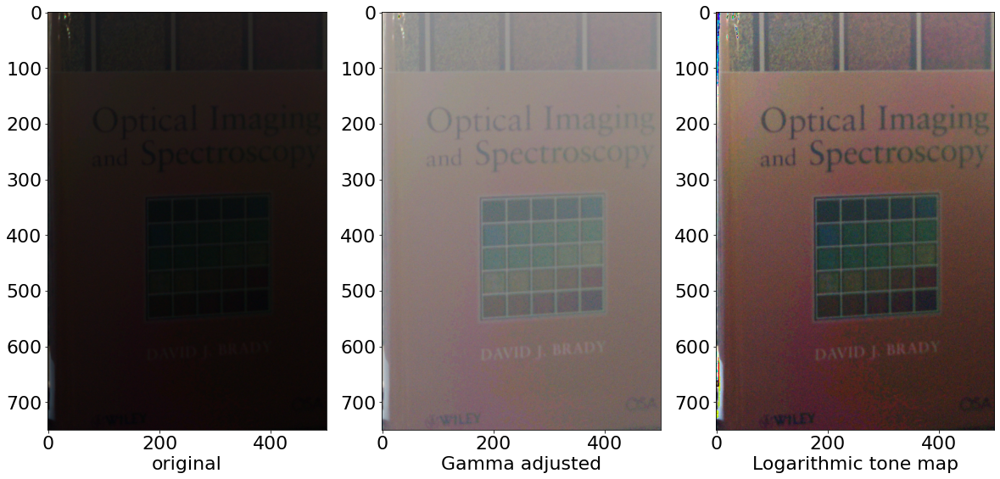

In [14]:
plt.subplot(1,3,1)
plt.imshow(colorImage[1250:2000,1400:1900])
plt.xlabel('original')
plt.subplot(1,3,2)
plt.imshow(exposure.adjust_gamma(colorImage[1250:2000,1400:1900],.3,1.1))
plt.xlabel('Gamma adjusted')
plt.subplot(1,3,3)
plt.imshow(exposure.adjust_log(colorImage[1250:2000,1400:1900],3))
plt.xlabel('Logarithmic tone map')

## Local Tonemapping

As suggested by the difference between the foreground and background image light levels in this image, better results may be obtained by applying different tone maps in different regions. One way to do this is to separate the foreground and background regions. In the current scene, this can be done by creating a mask with by thresholding signal values. 

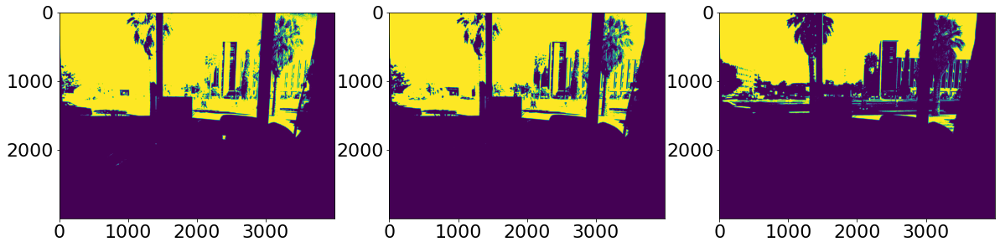

In [80]:
rthresh = threshold_otsu(colorImage[:,:,0])
rMask= colorImage[:,:,0] > rthresh
gthresh = threshold_otsu(colorImage[:,:,1])
gMask= colorImage[:,:,1] > gthresh
bthresh = threshold_otsu(colorImage[:,:,2])
bMask= colorImage[:,:,2] > bthresh
plt.subplot(1,3,1)
plt.imshow(rMask)
plt.subplot(1,3,2)
plt.imshow(gMask)
plt.subplot(1,3,3)
plt.imshow(bMask)


Here we apply a different gamma to the background and the foreground using the mask. 

Text(0.5, 0, 'original')

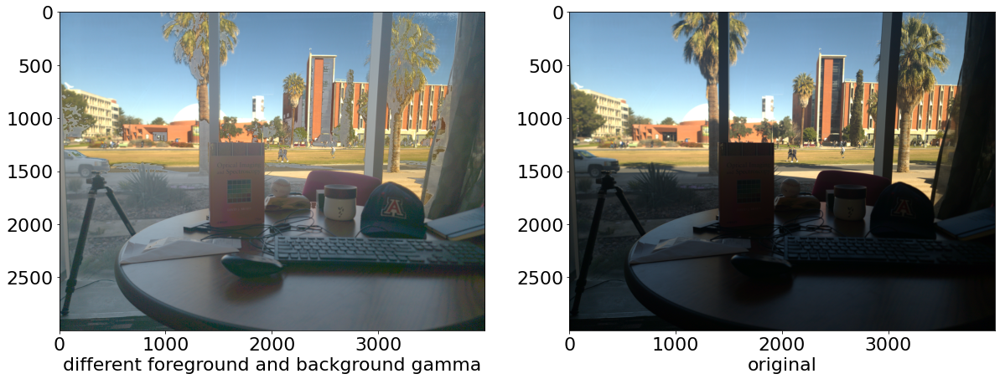

In [81]:
toneMap=np.zeros(np.shape(colorImage)).astype('uint8')
toneMap[:,:,0]=rMask*colorImage[:,:,0]+np.invert(rMask)*(exposure.adjust_gamma(colorImage,.4,1)[:,:,0])
toneMap[:,:,1]=rMask*colorImage[:,:,1]+np.invert(rMask)*(exposure.adjust_gamma(colorImage,.4,1)[:,:,1])
toneMap[:,:,2]=rMask*colorImage[:,:,2]+np.invert(rMask)*(exposure.adjust_gamma(colorImage,.4,1)[:,:,2])
plt.subplot(1,2,1)
plt.imshow(toneMap)
plt.xlabel('different foreground and background gamma')
plt.subplot(1,2,2)
plt.imshow(colorImage)
plt.xlabel('original')

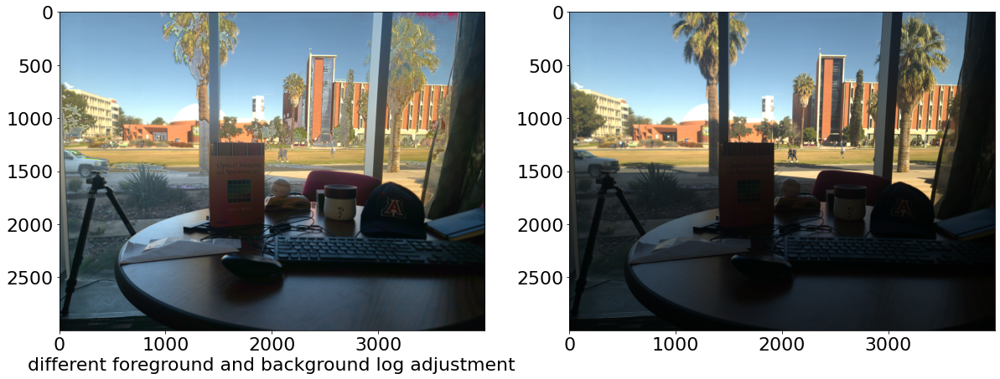

In [82]:
toneMap=np.zeros(np.shape(colorImage)).astype('uint8')
toneMap[:,:,0]=rMask*colorImage[:,:,0]+np.invert(rMask)*(exposure.adjust_log(colorImage,1.8)[:,:,0])
toneMap[:,:,1]=rMask*colorImage[:,:,1]+np.invert(rMask)*(exposure.adjust_log(colorImage,1.8)[:,:,1])
toneMap[:,:,2]=rMask*colorImage[:,:,2]+np.invert(rMask)*(exposure.adjust_log(colorImage,1.8)[:,:,2])
plt.subplot(1,2,1)
plt.imshow(toneMap)
plt.xlabel('different foreground and background log adjustment')
plt.subplot(1,2,2)
plt.imshow(colorImage)

### here we adjust the threshold for the mask

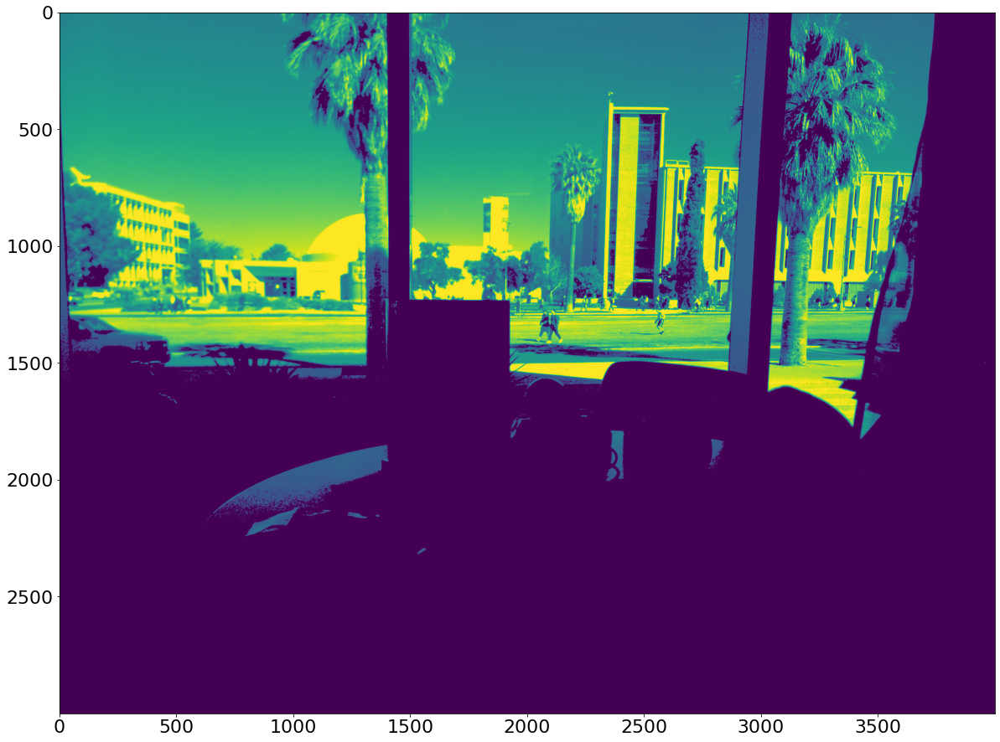

In [83]:
rthresh = threshold_otsu(colorImage[:,:,0])
rMask= colorImage[:,:,0] > .7*rthresh
plt.imshow(rMask*colorImage[:,:,0])

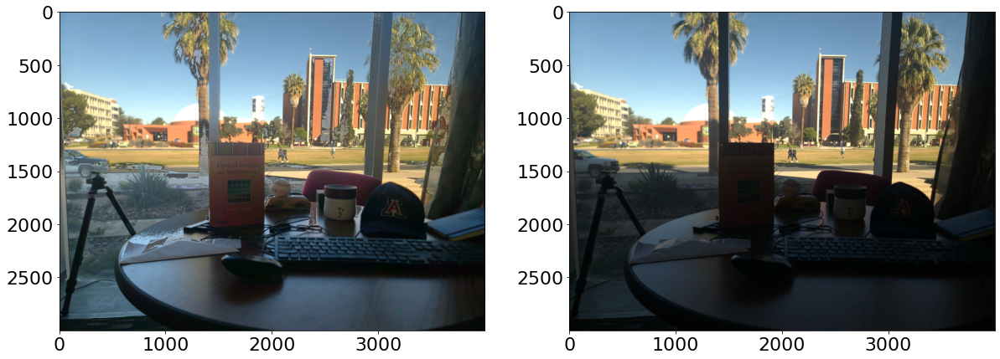

In [84]:
toneMap=np.zeros(np.shape(colorImage)).astype('uint8')
toneMap[:,:,0]=rMask*colorImage[:,:,0]+np.invert(rMask)*(exposure.adjust_log(colorImage,2)[:,:,0])
toneMap[:,:,1]=rMask*colorImage[:,:,1]+np.invert(rMask)*(exposure.adjust_log(colorImage,2)[:,:,1])
toneMap[:,:,2]=rMask*colorImage[:,:,2]+np.invert(rMask)*(exposure.adjust_log(colorImage,2)[:,:,2])
plt.subplot(1,2,1)
plt.imshow(toneMap)
plt.subplot(1,2,2)
plt.imshow(colorImage)

## Algorithmic local tone mapping

Numerous algorithms have been developed to use local measures of pixel contrast to adjust tone mapping to image features. See for example Yeganeh, Hojatollah, and Zhou Wang. "Objective quality assessment of tone-mapped images." IEEE Transactions on Image processing 22.2 (2012): 657-667.

Several such algorithms are implemented in OpenCV, see 
https://docs.opencv.org/4.x/d8/d5e/classcv_1_1Tonemap.html

Here we implement a tone map using the multiscale algorithm described in 

Mantiuk, Rafal, Karol Myszkowski, and Hans-Peter Seidel. "A perceptual framework for contrast processing of high dynamic range images." ACM Transactions on Applied Perception (TAP) 3.3 (2006): 286-308.

parameters are as follows

cv::createTonemapMantiuk (float gamma=1.0f, float scale=0.7f, float saturation=1.0f)



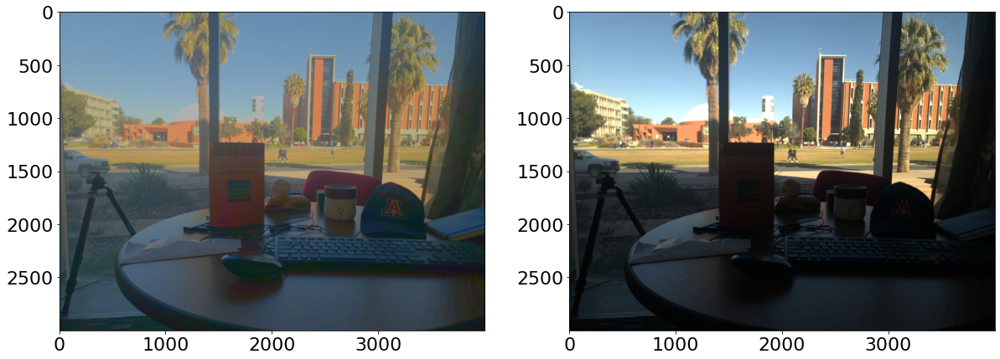

In [99]:
# Tonemap using Mantiuk's method 
tonemapMantiuk = cv2.createTonemapMantiuk()
tmImage = tonemapMantiuk.process(colorImage.astype('float32'))
tmImage=np.nan_to_num(tmImage, nan=0)
plt.subplot(1,2,1)
plt.imshow(tmImage)
plt.subplot(1,2,2)
plt.imshow(colorImage)



can try using local tone mapped foreground and linear background

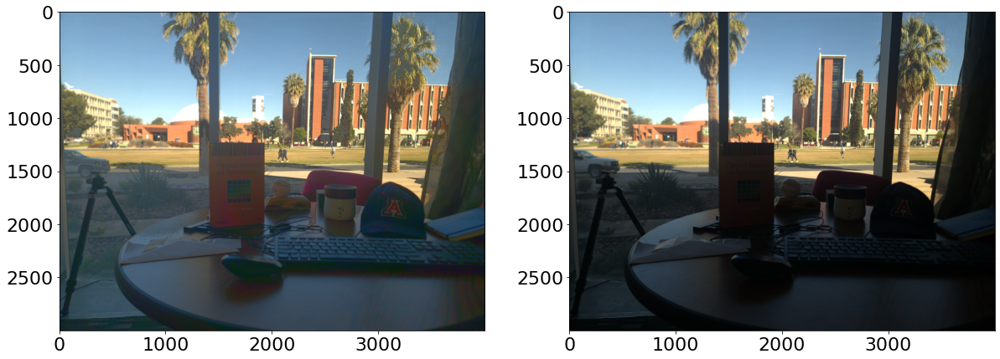

In [96]:
toneMap=np.zeros(np.shape(colorImage)).astype('uint8')
toneMap[:,:,0]=rMask*(colorImage[:,:,0])+np.invert(rMask)*(255*tmImage[:,:,0]).astype('uint8')
toneMap[:,:,1]=rMask*(colorImage[:,:,1])+np.invert(rMask)*(255*tmImage[:,:,1]).astype('uint8')
toneMap[:,:,2]=rMask*(colorImage[:,:,2])+np.invert(rMask)*(255*tmImage[:,:,2]).astype('uint8')
plt.subplot(1,2,1)
plt.imshow(toneMap)
plt.subplot(1,2,2)
plt.imshow(colorImage)

open cv includes several tone mapping algorithms

Text(0.5, 0, 'Mantiuk')

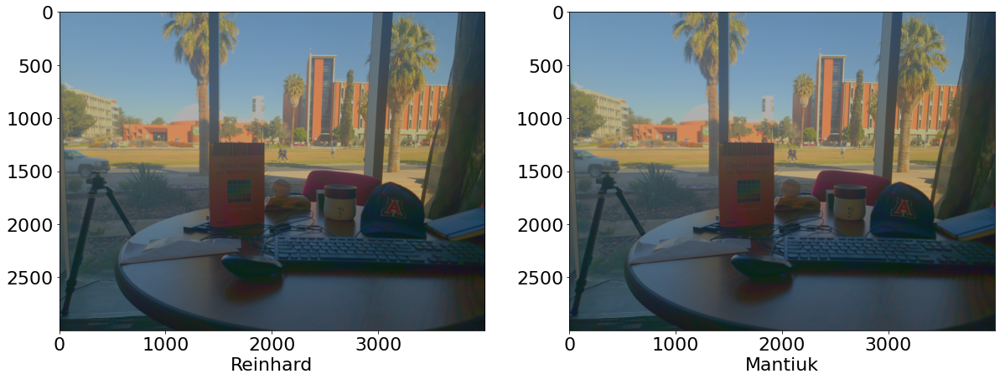

In [100]:
# Tonemap using Reinhard's method 
tonemapReinhard = cv2.createTonemapReinhard()
tmImageR = tonemapReinhard.process(colorImage.astype('float32'))
tmImageR=np.nan_to_num(tmImage, nan=0)
plt.subplot(1,2,1)
plt.imshow(tmImageR)
plt.xlabel('Reinhard')
plt.subplot(1,2,2)
plt.imshow(tmImage)
plt.xlabel('Mantiuk')

## Multiframe HDR imaging
### based on https://learnopencv.com/high-dynamic-range-hdr-imaging-using-opencv-cpp-python/

### read images and exposure times

In [19]:
# List of exposure times
exposureTimes = np.array([ 1/4000, 1/350, 1/60 ], dtype=np.float32)
# List of image filenames
filenames = ["background.jpg", "middle.jpg", "foreground.jpg"]
images = []
for filename in filenames:
  im = cv2.imread(filename)
  im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  images.append(im)

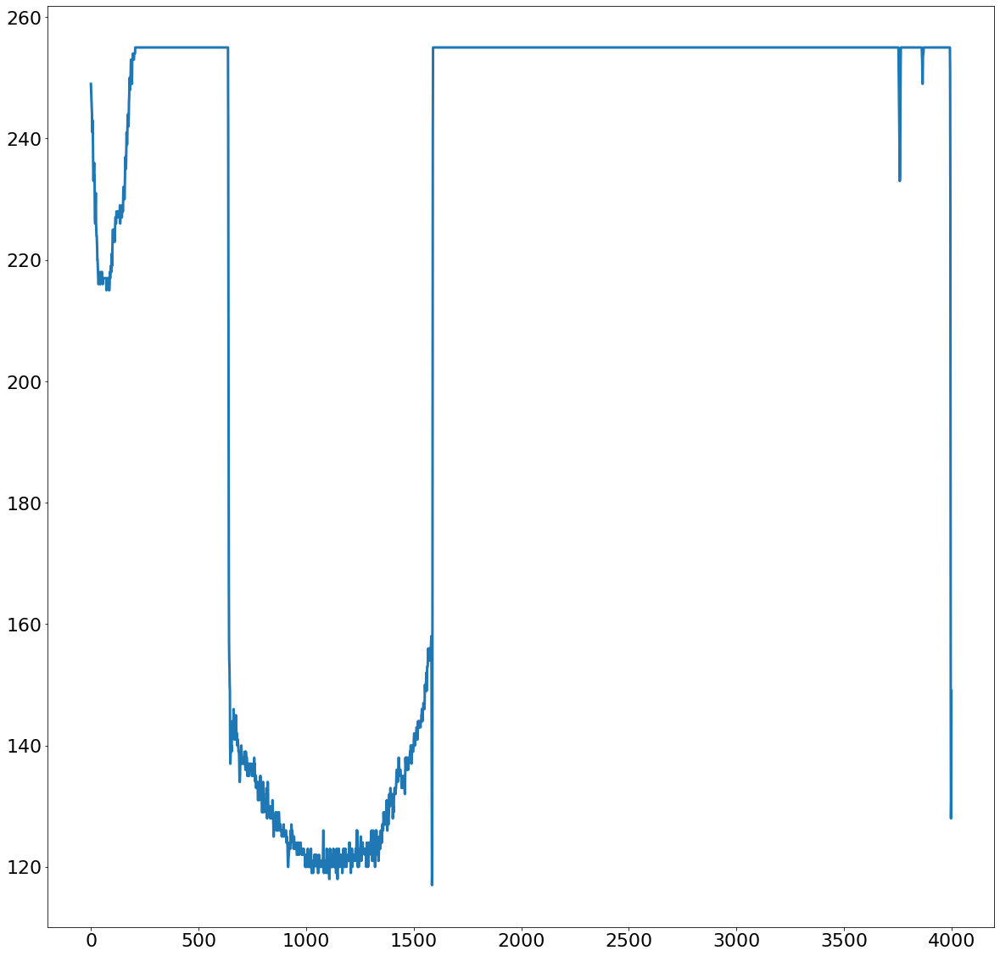

In [20]:
plt.plot(im[1000,:,0])

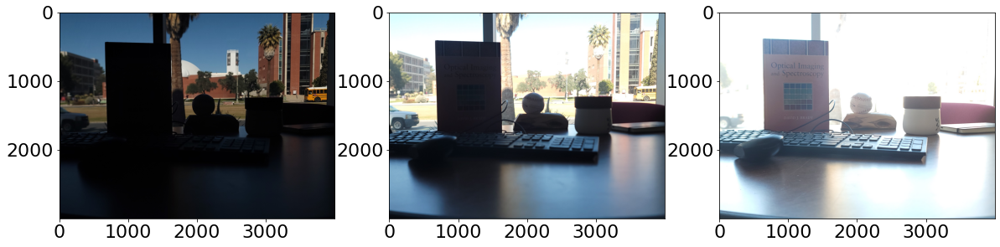

In [12]:
plt.subplot(1,3,1)
plt.imshow(images[0])
plt.subplot(1,3,2)
plt.imshow(images[1])
plt.subplot(1,3,3)
plt.imshow(images[2])

In [21]:
# Align input images
alignMTB = cv2.createAlignMTB()
alignMTB.process(images, images)

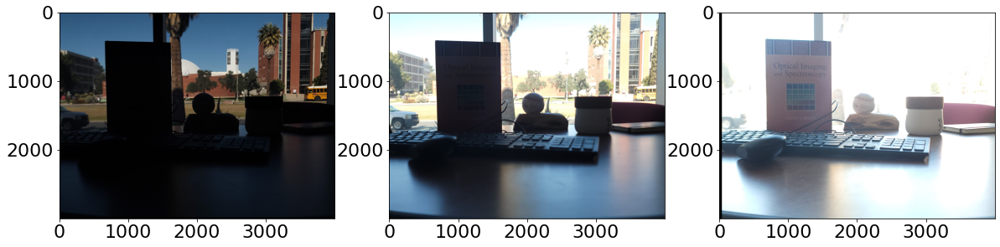

In [16]:
plt.subplot(1,3,1)
plt.imshow(images[0])
plt.subplot(1,3,2)
plt.imshow(images[1])
plt.subplot(1,3,3)
plt.imshow(images[2])

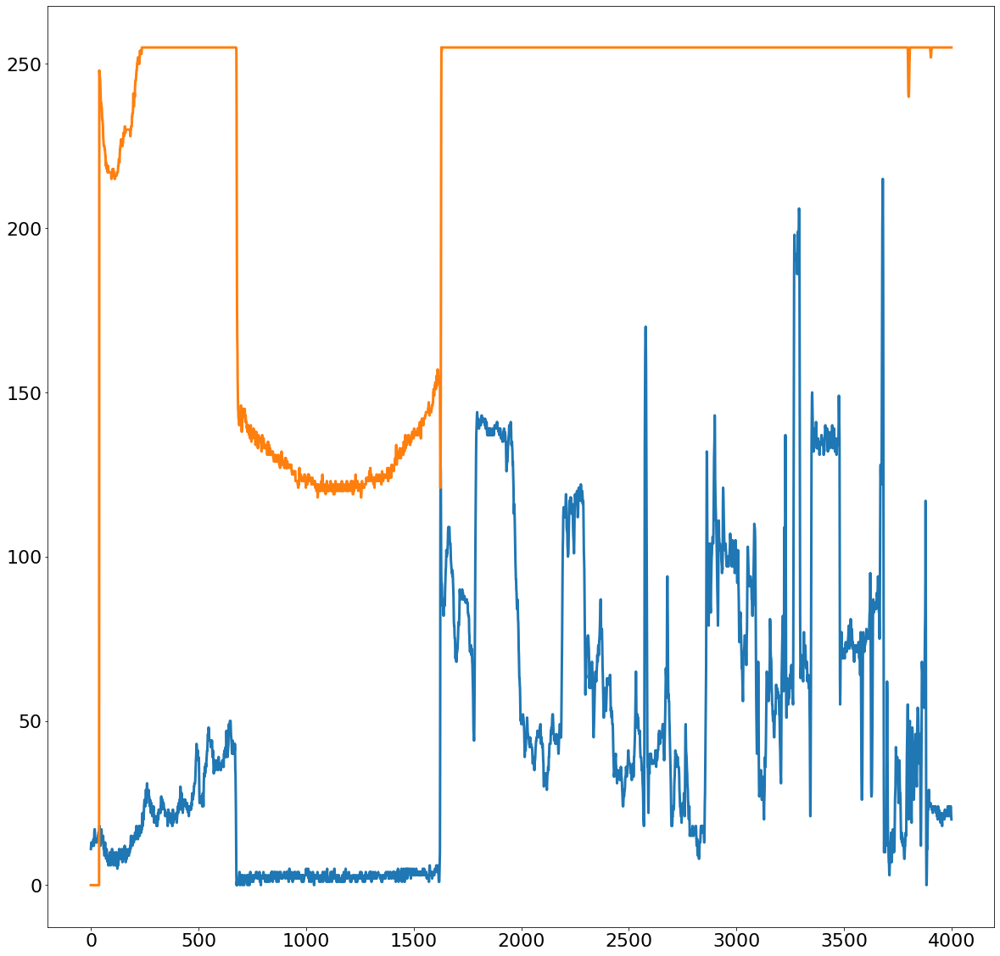

In [25]:
plt.plot(images[0][1000,:,0])
plt.plot(images[2][1000,:,0])

### Calculate camera response function

In [26]:
# Obtain Camera Response Function (CRF)
calibrateDebevec = cv2.createCalibrateDebevec()
responseDebevec = calibrateDebevec.process(images, exposureTimes)

In [81]:
responseDebevec.shape

(256, 1, 3)

Text(0.5, 0, 'calibrated intensity')

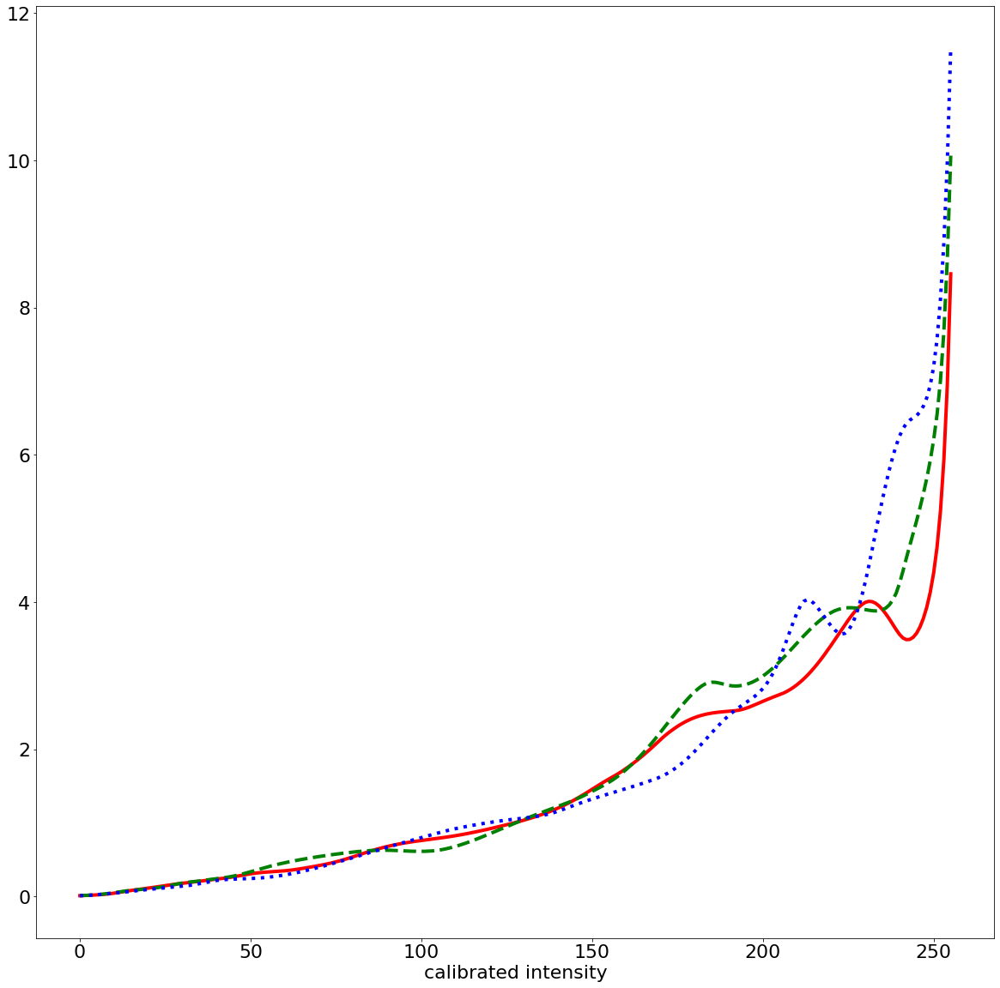

In [28]:
default_cycler = (cycler(color=['r', 'g', 'b', 'y']) +
                  cycler(linestyle=['-', '--', ':', '-.']))

plt.rc('lines', linewidth=4)
plt.rc('axes', prop_cycle=default_cycler)
plt.plot(responseDebevec[:,0,:])
plt.xlabel('measured intensity')
plt.xlabel('calibrated intensity')

### merge the images

In [34]:
# Merge images into an HDR linear image
mergeDebevec = cv2.createMergeDebevec()
hdrDebevec = mergeDebevec.process(images, exposureTimes, responseDebevec)
# Save HDR image.
cv2.imwrite("hdrDebevec.hdr", cv2.cvtColor(hdrDebevec, cv2.COLOR_BGR2RGB))
files.download('hdrDebevec.hdr')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [115]:
np.max(hdrDebevec)

30177.438

In [91]:
hdrDebevec.shape

(3000, 4000, 3)

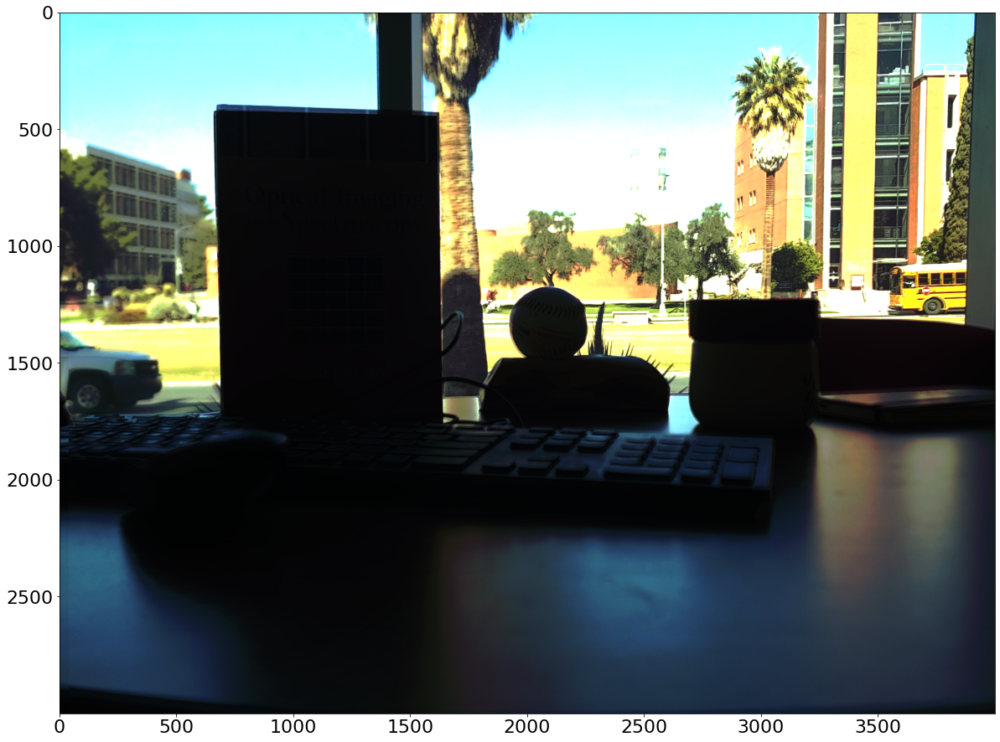

In [36]:
plt.imshow(hdrDebevec/2000.)

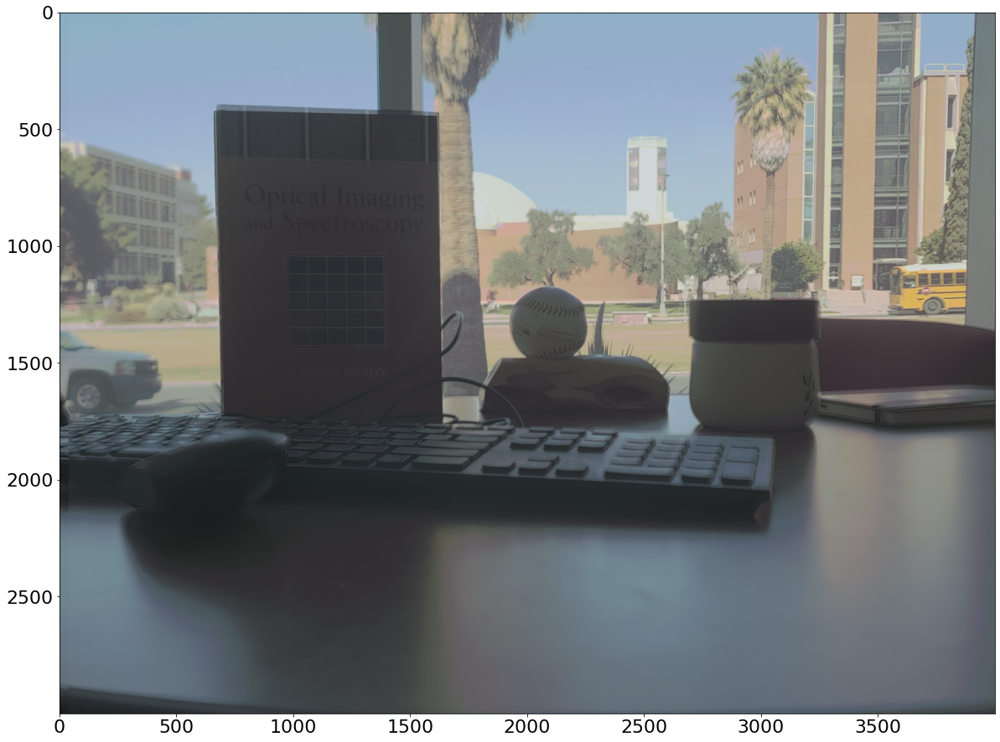

In [47]:
tonemapDrago = cv2.createTonemapDrago(2, .5)
ldrDrago = tonemapDrago.process(hdrDebevec)
plt.imshow((255*ldrDrago).astype('uint8'))

In [42]:
np.min(ldrDrago)

2.877234e-34

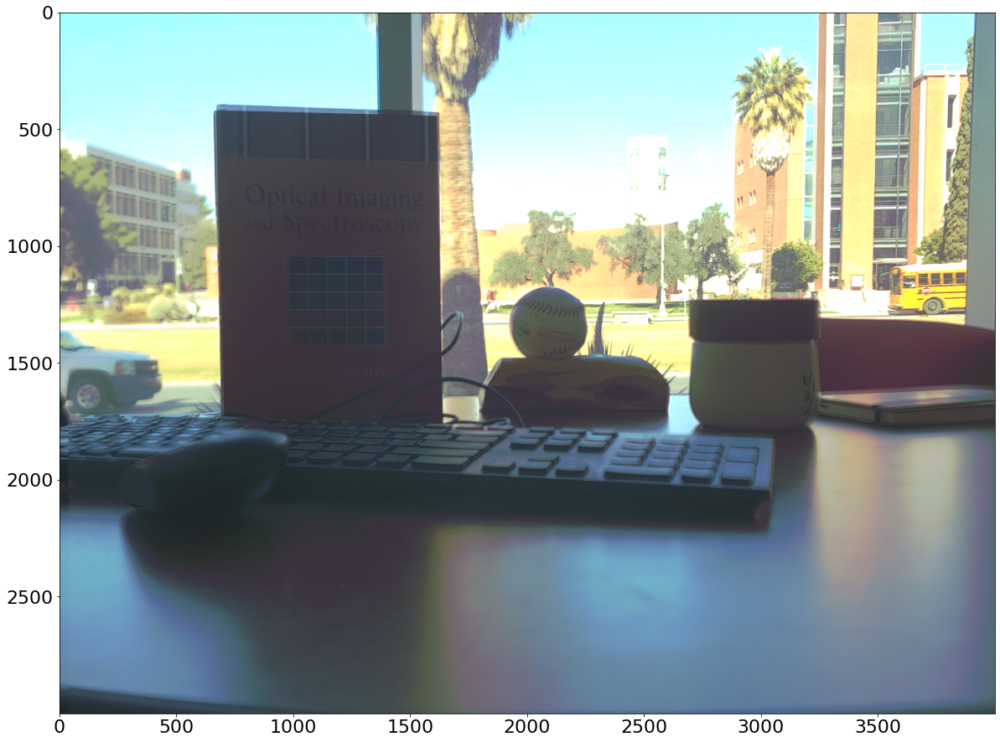

In [50]:
tonemapMantiuk = cv2.createTonemapMantiuk(1.78,0.85, 1)
ldrMantiuk = tonemapMantiuk.process(hdrDebevec)
ldrMantiuk = 3 * ldrMantiuk
plt.imshow(ldrMantiuk)